In [160]:
#import library for data frame
import pandas as pd
import numpy as np
!pip install missingno


[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [161]:
#read the data frame 
df = pd.read_csv("data/King_County_House_prices_dataset.csv")

#show top 5 rows
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


1. Data Exploration

In [162]:
#display columns
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [163]:
#check data frame information 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [164]:
#display statistic descriptive
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,19221.000000,21534.000000,21597.000000,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.007596,0.233863,3.409825,7.657915,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.086825,0.765686,0.650546,1.173200,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


2. Duplicate

In [165]:
#check duplicates in rows
df.duplicated().value_counts()

False    21597
Name: count, dtype: int64

3. Change Data Type

In [166]:
#change waterfront column dtpye from float to integer (binary column 0= no, 1=yes) 
df['waterfront'] = pd.to_numeric(df['waterfront'], errors='coerce').astype('Int64')

In [167]:
#change view column dtpye from float to integer (binary column 0= no, 1=yes)
df['view'] = pd.to_numeric(df['view'], errors='coerce').astype('Int64')

In [168]:
#display unique values to check unusual entries 
df['sqft_basement'].unique()

array(['0.0', '400.0', '910.0', '1530.0', '?', '730.0', '1700.0', '300.0',
       '970.0', '760.0', '720.0', '700.0', '820.0', '780.0', '790.0',
       '330.0', '1620.0', '360.0', '588.0', '1510.0', '410.0', '990.0',
       '600.0', '560.0', '550.0', '1000.0', '1600.0', '500.0', '1040.0',
       '880.0', '1010.0', '240.0', '265.0', '290.0', '800.0', '540.0',
       '710.0', '840.0', '380.0', '770.0', '480.0', '570.0', '1490.0',
       '620.0', '1250.0', '1270.0', '120.0', '650.0', '180.0', '1130.0',
       '450.0', '1640.0', '1460.0', '1020.0', '1030.0', '750.0', '640.0',
       '1070.0', '490.0', '1310.0', '630.0', '2000.0', '390.0', '430.0',
       '850.0', '210.0', '1430.0', '1950.0', '440.0', '220.0', '1160.0',
       '860.0', '580.0', '2060.0', '1820.0', '1180.0', '200.0', '1150.0',
       '1200.0', '680.0', '530.0', '1450.0', '1170.0', '1080.0', '960.0',
       '280.0', '870.0', '1100.0', '460.0', '1400.0', '660.0', '1220.0',
       '900.0', '420.0', '1580.0', '1380.0', '475.0', 

In [169]:
#count how often each value appears in 'sqft_basement'
sqft_basement_counts = df['sqft_basement'].value_counts()
print(sqft_basement_counts)

sqft_basement
0.0       12826
?           454
600.0       217
500.0       209
700.0       208
          ...  
1920.0        1
3480.0        1
2730.0        1
2720.0        1
248.0         1
Name: count, Length: 304, dtype: int64


In [170]:
#replace '?' with NaN in 'sqft_basement' column to handle missing data
df['sqft_basement'] = df['sqft_basement'].replace('?', np.nan)

In [171]:
#convert 'sqft_basement' to numeric - setting invalid values to NaN
df['sqft_basement'] = pd.to_numeric(df['sqft_basement'], errors='coerce')

In [172]:
#change sqft_basement column dtpye from object to integer (can hold missing values)
df['sqft_basement'] = df['sqft_basement'].astype('Int64')

In [173]:
#change yr_renovated column dtpye from float to integer (supports missing values)
df['yr_renovated'] = df['yr_renovated'].astype('Int64')

In [174]:
#check number of missing entries in 'yr_renovated'
df['yr_renovated'].isnull().sum()

3842

3. Missing Data

In [175]:
#import missingno library for visualizing missing data
import missingno as msno

In [176]:
#display data frame
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,<NA>,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,<NA>,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,<NA>,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [177]:
#check the missing values in each of the column
df.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     454
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

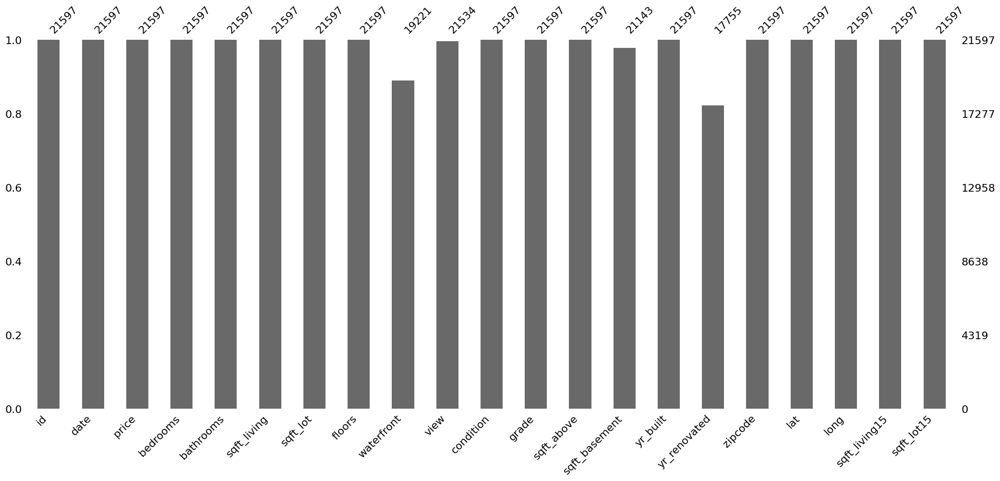

In [178]:
#bar chart of the missing values 
msno.bar(df);

<p style="color:#90ee90;"><strong>Analysis:</strong></p>

<ul style="color:#90ee90;">
  <li>Most columns have almost complete data (~21,597 non-missing entries).</li>
  <li><strong>Waterfront</strong> (~19,221 non-missing) and <strong>view</strong> (~21,534 non-missing) have some missing values, but most data is still available.</li>
  <li><strong>yr_renovated</strong> has many missing entries (~17,755 non-missing), so it needs special attention.</li>
  <li>Other columns have little to no missing data.</li>
</ul>

<p style="color:#90ee90;"><strong>Summary:</strong></p>

<ul style="color:#90ee90;">
  <li>Overall, the dataset is mostly complete.</li>
  <li>Missing data in <strong>waterfront</strong>, <strong>view</strong>, and especially <strong>yr_renovated</strong> should be addressed.</li>
  <li>Handling <strong>yr_renovated</strong> requires extra care due to the large proportion of missing values.</li>
</ul>

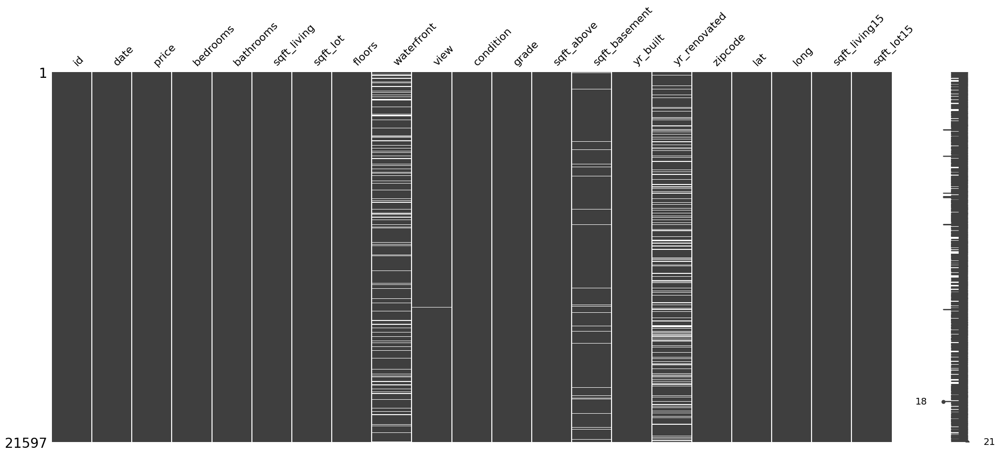

In [179]:
#matrix visualization of the missing values
msno.matrix(df);

In [180]:
#count the number of missing (NaN) values in each column
df.isnull().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     454
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

In [181]:
#print total number of rows in the DataFrame
print(f"numbers of rows : {df.shape[0]}")

#calculate and print percentage of missing values in 'waterfront', 'view', 'sqft_basement', 'yr_renovated' columns
print(f"missing values in waterfront : {round(df.waterfront.isna().sum()/df.shape[0]*100,2)} %")
print(f"missing values in view : {round(df.view.isna().sum()/df.shape[0]*100,2)} %")
print(f"missing values in sqft_basement : {round(df.sqft_basement.isna().sum()/df.shape[0]*100,2)} %")
print(f"missing values in year renovated : {round(df.yr_renovated.isna().sum()/df.shape[0]*100,2)} %")

#calculate and print total percentage of missing values in the entire DataFrame
print(f"missing values in data frame : {round(df.isna().sum().sum()/(df.shape[0]*df.shape[1])*100,2)} %")

numbers of rows : 21597
missing values in waterfront : 11.0 %
missing values in view : 0.29 %
missing values in sqft_basement : 2.1 %
missing values in year renovated : 17.79 %
missing values in data frame : 1.48 %


4. Dropping Data

In [182]:
#remove the 'id' column since it's not useful for analysis
# df = df.drop(columns=['id'])

In [183]:
#display data frame after dropping the 'id' column
#df.head()

5. Transforming Data and Imputing

In [184]:
#convert dates in 'date' column using month/day/year format
df['date'] = pd.to_datetime(df['date'], format='%m/%d/%Y')
print(df['date'])

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21597, dtype: datetime64[ns]


In [185]:
#create a copy of the dataset
df_fillna_copy = df.copy()

#use fillna to impute missing values
df_filled_ffill = df.fillna(0)
print(df_filled_ffill)

               id       date     price  bedrooms  bathrooms  sqft_living  \
0      7129300520 2014-10-13  221900.0         3       1.00         1180   
1      6414100192 2014-12-09  538000.0         3       2.25         2570   
2      5631500400 2015-02-25  180000.0         2       1.00          770   
3      2487200875 2014-12-09  604000.0         4       3.00         1960   
4      1954400510 2015-02-18  510000.0         3       2.00         1680   
...           ...        ...       ...       ...        ...          ...   
21592   263000018 2014-05-21  360000.0         3       2.50         1530   
21593  6600060120 2015-02-23  400000.0         4       2.50         2310   
21594  1523300141 2014-06-23  402101.0         2       0.75         1020   
21595   291310100 2015-01-16  400000.0         3       2.50         1600   
21596  1523300157 2014-10-15  325000.0         2       0.75         1020   

       sqft_lot  floors  waterfront  view  ...  grade  sqft_above  \
0          5650   

In [186]:
#replace all missing values in the DataFrame with 0 (to modifies original DataFrame)
df.fillna(0, inplace=True)

5. Data Visualization

In [187]:
#import libraries for visualization 
import matplotlib.pyplot as plt
import seaborn as sns

<h2 style="color:blue;">HYPOTHESES 1</h2>

<p style="color:yellow;">1. Location influences property' value?</p>

- How are house prices distributed geographically, 
- Is there a central cluster of high-priced homes indicating a spatial dependency—such that prices increase as we move closer to a specific location (e.g., downtown)
- What is the strength of the correlation between geographic coordinates and house prices?

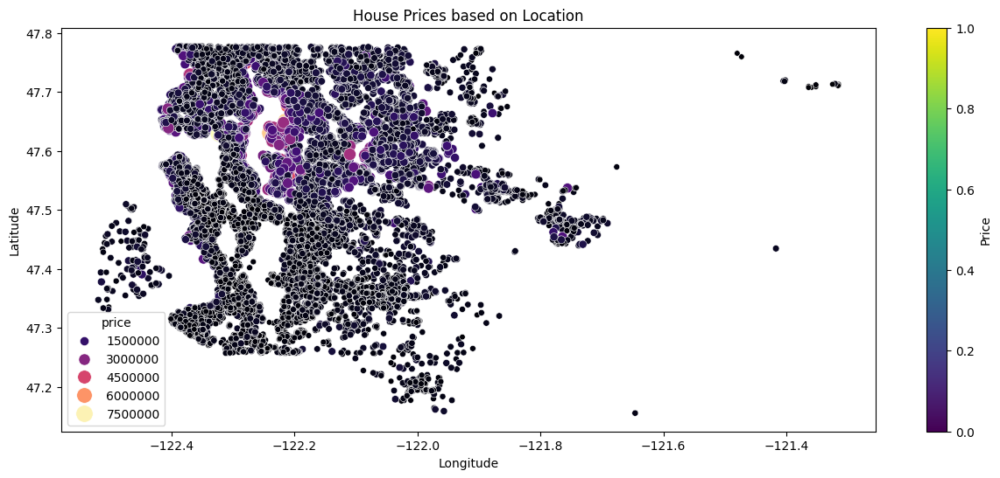

In [188]:
#display house prices based on the location to find out the center of the location 
plt.figure(figsize=(15, 6))
scatter_plot = sns.scatterplot(x='long', y='lat', hue='price', data=df, palette='magma', size='price', sizes=(20, 200))
plt.title('House Prices based on Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(scatter_plot.collections[0], label='Price')

plt.show()

- Which geographic areas have the highest concentration of houses, indicating neighborhoods or regions with the greatest housing density?

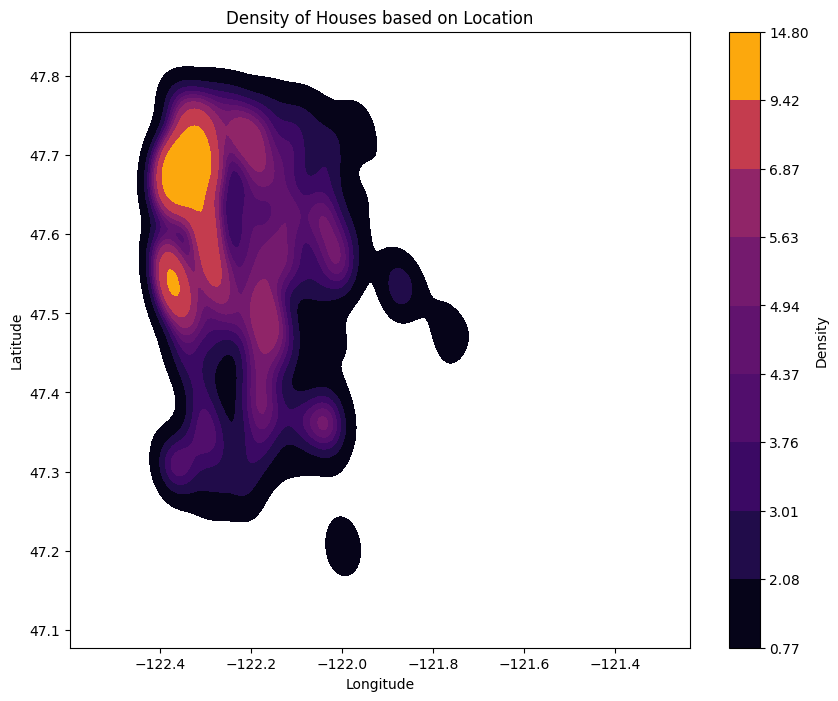

In [189]:
#display the density of the houses based of location to find out which area is the most populated 
plt.figure(figsize=(10, 8))
kde = sns.kdeplot(x=df['long'], y=df['lat'], cmap='inferno', fill=True)

plt.title('Density of Houses based on Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

cbar = plt.colorbar(kde.collections[0])
cbar.set_label('Density')

plt.show()

- The average (mean) latitude and longitude of all house locations, the "geographic center" of the dataset?
- Where the "center point" of the housing distribution lies geographically?
- How the overall housing locations are spread relative to this central point?

Central Latitude: 47.56009299439737, Central Longitude: -122.2139824975691


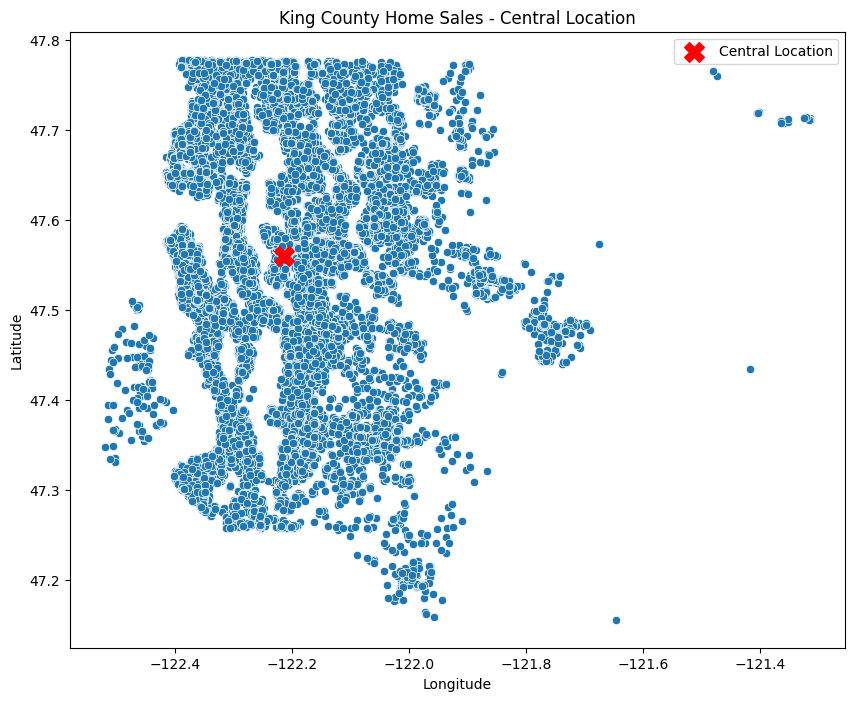

In [190]:
#calculate the mean latitude and mean longitude
central_latitude = df['lat'].mean()
central_longitude = df['long'].mean()

print(f"Central Latitude: {central_latitude}, Central Longitude: {central_longitude}")

#display the central location based on latitude and longitude 
plt.figure(figsize=(10, 8))
sns.scatterplot(x='long', y='lat', data=df)
plt.scatter(central_longitude, central_latitude, color='red', marker='X', s=200, label='Central Location')
plt.title('King County Home Sales - Central Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

- What is the median house price in King County, and how does it represent the typical home value compared to the overall price distribution?

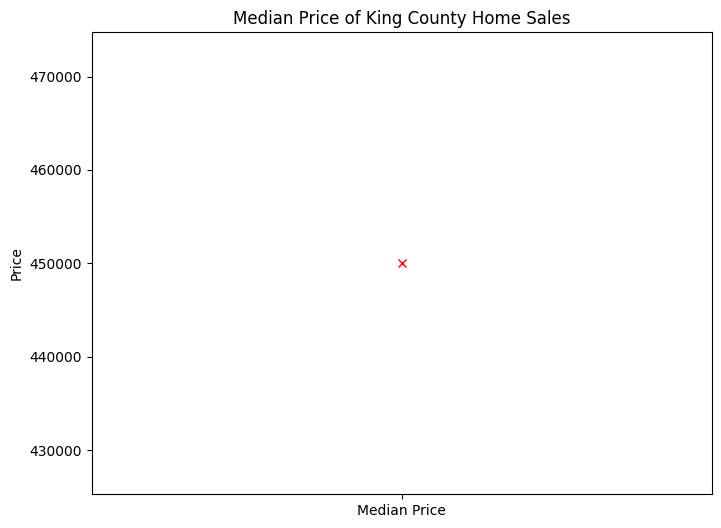

In [191]:
#calculated the median price 
median_price = df['price'].median()

#display the median price of the houses 
plt.figure(figsize=(8, 6))
plt.plot(['Median Price'], [median_price], marker='x', color='red')
plt.ylabel('Price')
plt.title('Median Price of King County Home Sales')
plt.show()

- What is the narrower central range of house prices in King County when trimming 25% from both ends of the interquartile range?
- How does this range relate to the overall price distribution and median price?

Median Price: 450000.0
Middle Range Lower Bound: 402750.0
Middle Range Upper Bound: 564250.0


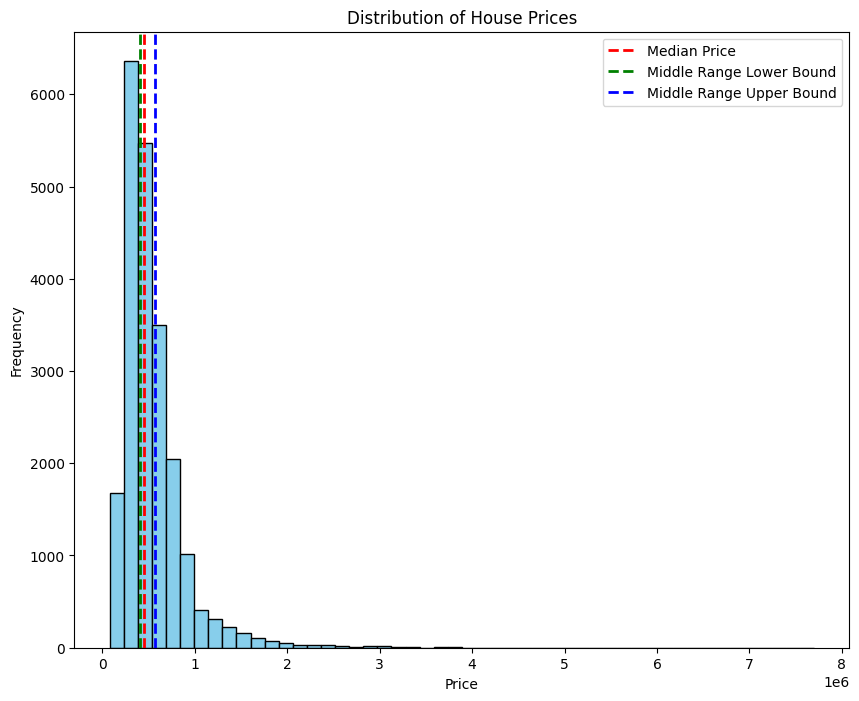

In [192]:
#define a tighter middle price range by trimming 25% of the IQR from both ends
median_price = df['price'].median()

#calculate the lower and upper quartiles
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)

#calculate the IQR
IQR = Q3 - Q1

#middle range based on IQR
middle_range_lower = Q1 + 0.25 * IQR
middle_range_upper = Q3 - 0.25 * IQR

print(f"Median Price: {median_price}")
print(f"Middle Range Lower Bound: {middle_range_lower}")
print(f"Middle Range Upper Bound: {middle_range_upper}")

#display the distribution of house prices
plt.figure(figsize=(10, 8))
plt.hist(df['price'], bins=50, color='skyblue', edgecolor='black')
plt.axvline(median_price, color='red', linestyle='dashed', linewidth=2, label='Median Price')
plt.axvline(middle_range_lower, color='green', linestyle='dashed', linewidth=2, label='Middle Range Lower Bound')
plt.axvline(middle_range_upper, color='blue', linestyle='dashed', linewidth=2, label='Middle Range Upper Bound')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.title('Distribution of House Prices')
plt.legend()
plt.show()

- How have the average house prices in King County changed over time, and what trends or patterns can be observed from the mean price by date?

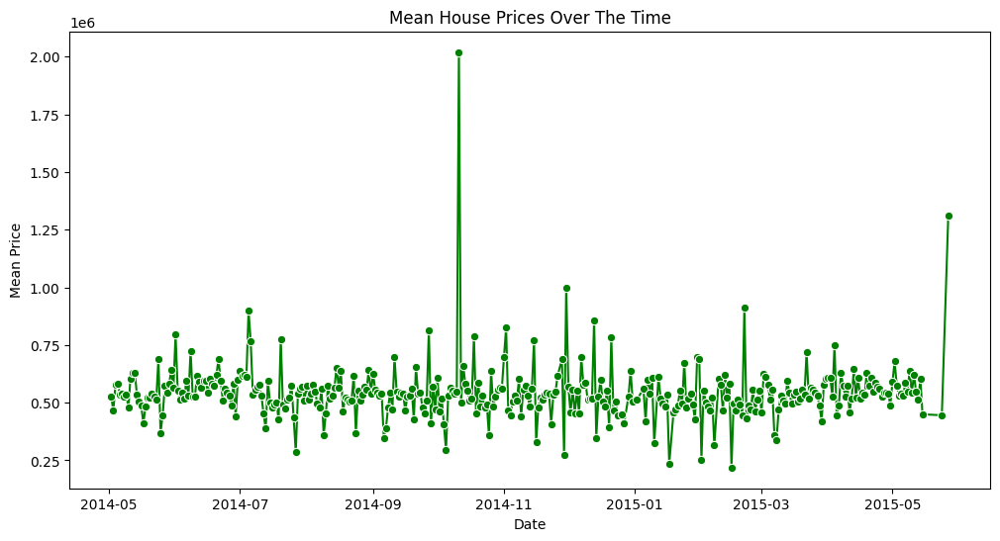

In [193]:
#group by date to calculate mean price to find the trend of average house prices over time 
mean_price_by_date = df.groupby('date')['price'].mean()

#display the mean house prices 
plt.figure(figsize=(12, 6))
sns.lineplot(x=mean_price_by_date.index, y=mean_price_by_date.values, color='green', marker='o')
plt.title('Mean House Prices Over The Time')
plt.xlabel('Date')
plt.ylabel('Mean Price')
plt.show()

- How has the median house price in King County evolved over time, and what does this reveal about typical market trends and price stability?

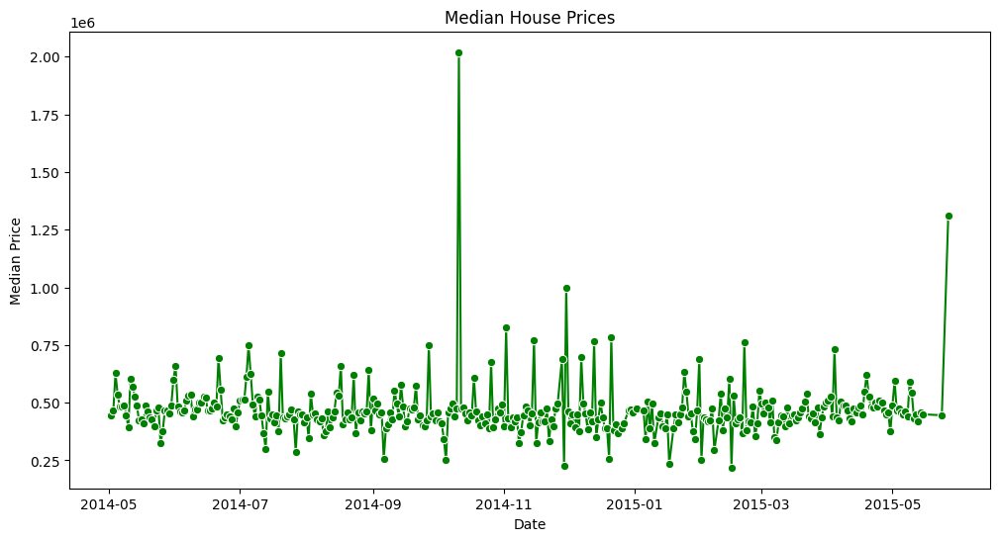

In [194]:
#group by date to calculate median price
median_price_by_date = df.groupby('date')['price'].median()

#display the median house prices 
plt.figure(figsize=(12, 6))
sns.lineplot(x=median_price_by_date.index, y=median_price_by_date.values, color='green', marker='o')
plt.title('Median House Prices')
plt.xlabel('Date')
plt.ylabel('Median Price')
plt.show()

- What are the monthly trends in median house prices over time, and how do these fluctuations reflect the housing market’s seasonality and overall movement?

<Axes: xlabel='date', ylabel='Price ($)'>

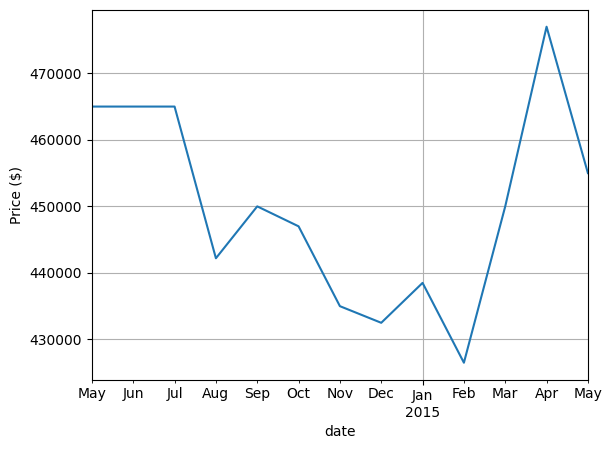

In [195]:
#display the average price within the time 
avg_price = df.groupby(df['date'].dt.to_period('M'))['price'].median()
avg_price.plot(kind='line', grid=True, ylabel='Price ($)')

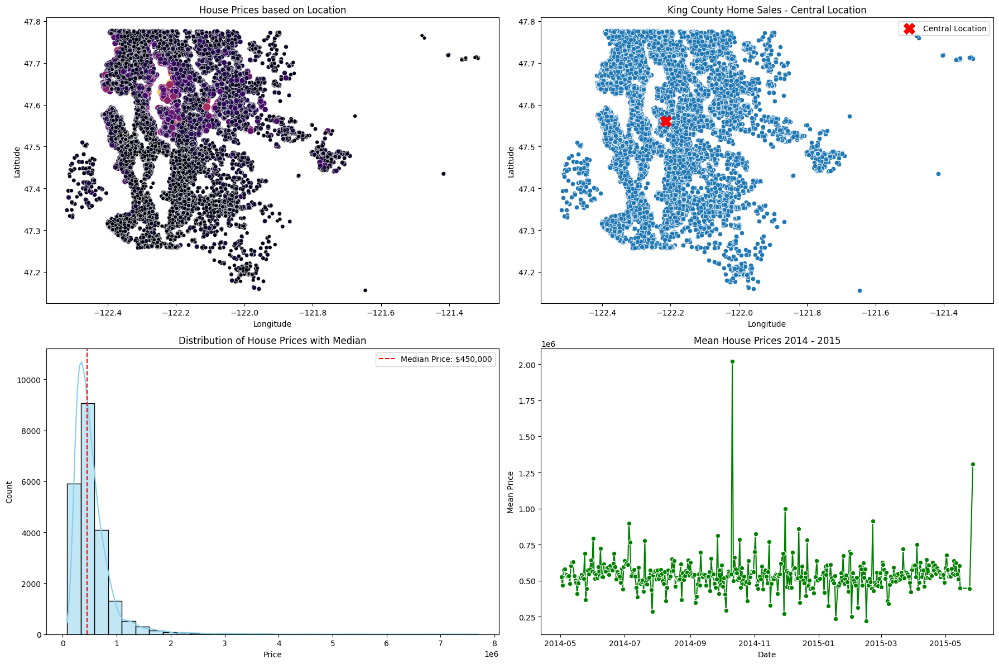

In [196]:
#calculate central location
central_latitude = df['lat'].mean()
central_longitude = df['long'].mean()

#calculate median price
median_price = df['price'].median()

#group by date to calculate mean price
mean_price_by_date = df.groupby('date')['price'].mean()

#create a single 2x2 figure
plt.figure(figsize=(18, 12))

# Plot 1: House Prices based on Location
plt.subplot(2, 2, 1)
sns.scatterplot(x='long', y='lat', hue='price', data=df, palette='inferno', size='price', sizes=(20, 200), legend=False)
plt.title('House Prices based on Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Plot 2: Central Location
plt.subplot(2, 2, 2)
sns.scatterplot(x='long', y='lat', data=df)
plt.scatter(central_longitude, central_latitude, color='red', marker='X', s=200, label='Central Location')
plt.title('King County Home Sales - Central Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()

# Plot 3: Median Price (horizontal line)
plt.subplot(2, 2, 3)
sns.histplot(df['price'], bins=30, kde=True, color='skyblue')
plt.axvline(median_price, color='red', linestyle='--', label=f'Median Price: ${median_price:,.0f}')
plt.title('Distribution of House Prices with Median')
plt.xlabel('Price')
plt.ylabel('Count')
plt.legend()

# Plot 4: Mean House Prices Over Time
plt.subplot(2, 2, 4)
sns.lineplot(x=mean_price_by_date.index, y=mean_price_by_date.values, color='green', marker='o')
plt.title('Mean House Prices 2014 - 2015')
plt.xlabel('Date')
plt.ylabel('Mean Price')

plt.tight_layout()
plt.show()


<h3 style="color:hotpink;">Advice:</h3>

<ol style="color:hotpink;">
  <li><strong>Location matters:</strong> Prices vary a lot by area. High-value homes cluster in certain spots, not evenly spread out</li>
  <li><strong>Median price:</strong> The median shows typical home prices and avoids being skewed by very expensive houses</li>
  <li><strong>Rising prices:</strong> House prices have been steadily increasing over time, so buying sooner is better</li>
</ol>

<h3 style="color:hotpink;">Tips:</h3>

<ol style="color:hotpink;">
  <li>Buyers should focus on popular neighborhoods and set budgets around the median price</li>
  <li>Sellers can price competitively near the median to attract buyers</li>
  <li>Investors should watch hot areas where prices are climbing</li>
</ol>

<h2 style="color:blue;">HYPOTHESES 2</h2>

<p style="color:yellow;">2. Property features increase house price?</p>

- To what extent do property features—such as square footage, number of bedrooms, bathrooms, and lot size—affect or increase house prices, etc.?

- How does having a waterfront impact house price?

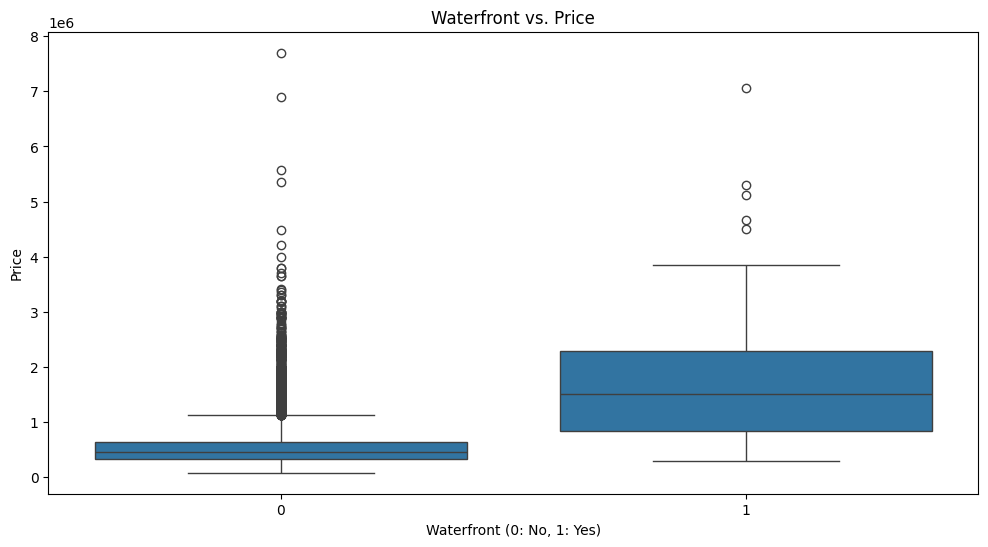

In [197]:
#box plot: Waterfront vs. Price
plt.figure(figsize=(12, 6))
sns.boxplot(x='waterfront', y='price', data=df)
plt.title('Waterfront vs. Price')
plt.xlabel('Waterfront (0: No, 1: Yes)')
plt.ylabel('Price')
plt.show()

- How does the quality of a house’s view affect its price?

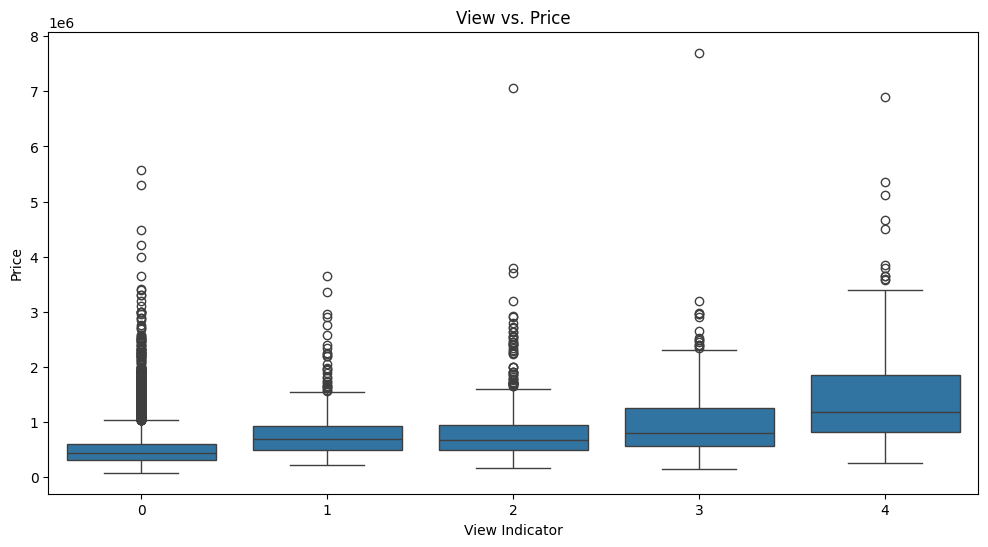

In [198]:
#box plot: View vs. Price
plt.figure(figsize=(12, 6))
sns.boxplot(x='view', y='price', data=df)
plt.title('View vs. Price')
plt.xlabel('View Indicator')
plt.ylabel('Price')
plt.show()

- How does average lot size of nearby properties (sqft_lot15) vary across different zip codes?

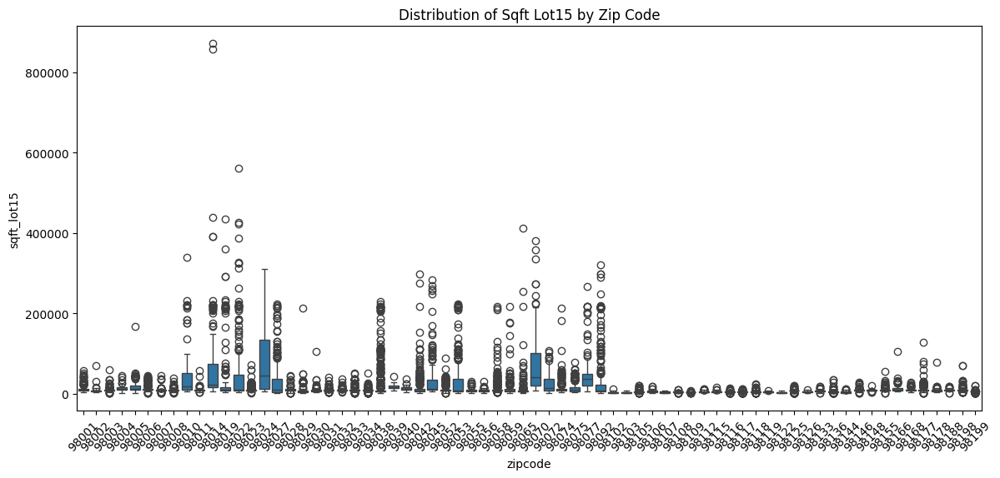

In [199]:
#display 'Zip Code' and 'Sqft Lot15'
# plt.figure(figsize=(10, 6))
# sns.scatterplot(x='zipcode', y='sqft_lot15', data=df)
# plt.title('Zip Code vs. Sqft Lot15')
# plt.xlabel('Zip Code')
# plt.ylabel('Sqft Lot15')
# plt.show()

#distribution of sqft_lot15 for each zip code
plt.figure(figsize=(14, 6))
sns.boxplot(x='zipcode', y='sqft_lot15', data=df)
plt.title('Distribution of Sqft Lot15 by Zip Code')
plt.xticks(rotation=45)
plt.show()

- How does the average lot size (sqft_lot15) vary across zip codes, and which areas tend to have the largest or smallest residential lots?

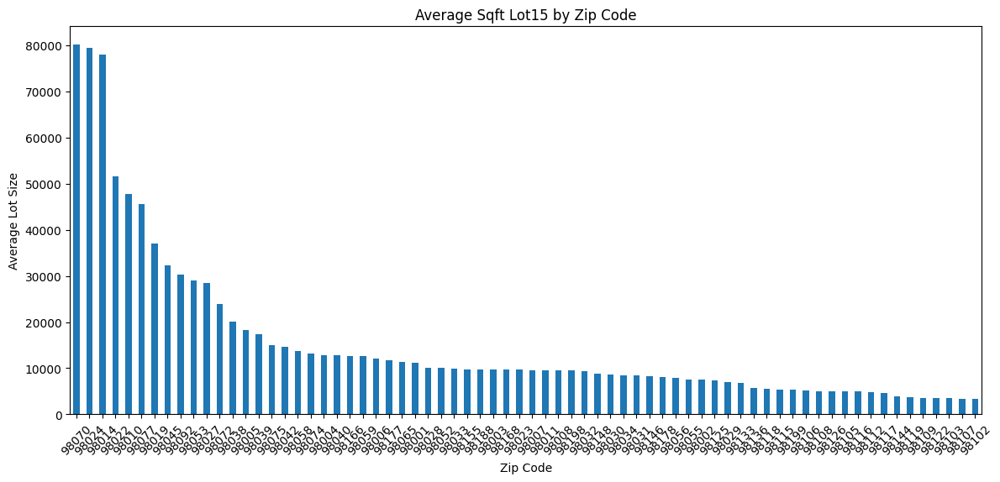

In [200]:
#average lot size per zip
avg_lot_by_zip = df.groupby('zipcode')['sqft_lot15'].mean().sort_values(ascending=False)

plt.figure(figsize=(14, 6))
avg_lot_by_zip.plot(kind='bar')
plt.title('Average Sqft Lot15 by Zip Code')
plt.ylabel('Average Lot Size')
plt.xlabel('Zip Code')
plt.xticks(rotation=45)
plt.show()

- Which zip codes have the largest average lot size (sqft_lot15)?

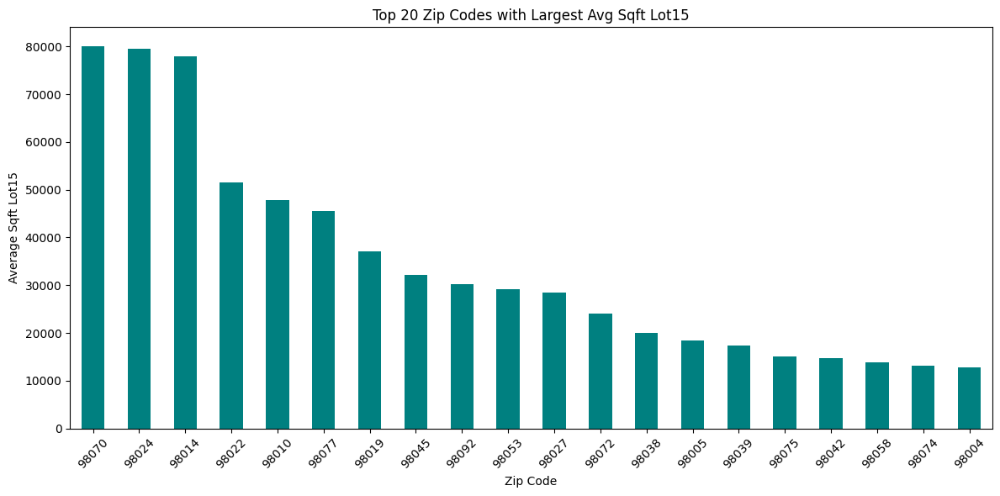

In [201]:
#calculate mean lot size per zip code
lot_size_by_zip = df.groupby('zipcode')['sqft_lot15'].mean().sort_values(ascending=False)

#display top 20 zip codes with largest avg lot sizes
plt.figure(figsize=(12, 6))
lot_size_by_zip.head(20).plot(kind='bar', color='teal')
plt.title('Top 20 Zip Codes with Largest Avg Sqft Lot15')
plt.xlabel('Zip Code')
plt.ylabel('Average Sqft Lot15')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

- How do average interior home sizes in neighborhoods differ across zip codes?

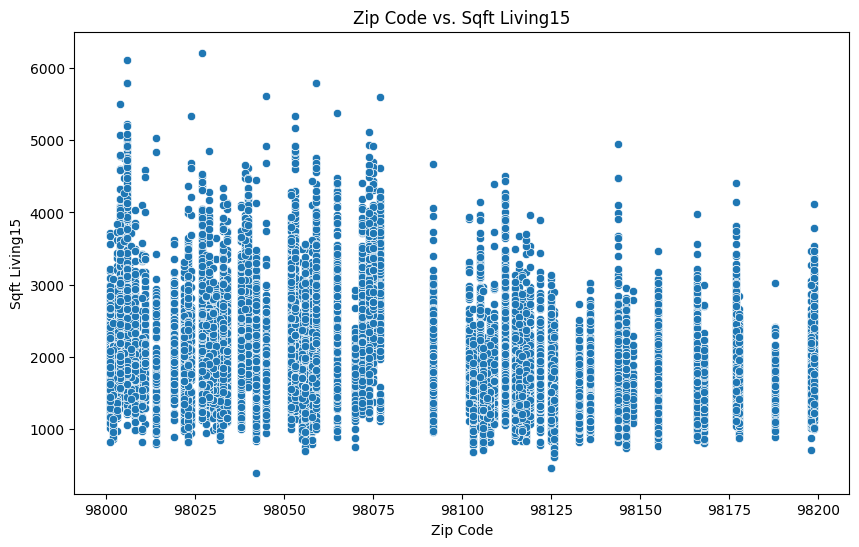

In [202]:
#display Zip Code vs. Sqft Living 15
plt.figure(figsize=(10, 6))
sns.scatterplot(x='zipcode', y='sqft_living15', data=df)
plt.title('Zip Code vs. Sqft Living15')
plt.xlabel('Zip Code')
plt.ylabel('Sqft Living15')
plt.show()

- How does the distribution of house sizes (sqft_living15) vary across different zip codes, and which zip codes tend to have larger or smaller homes?

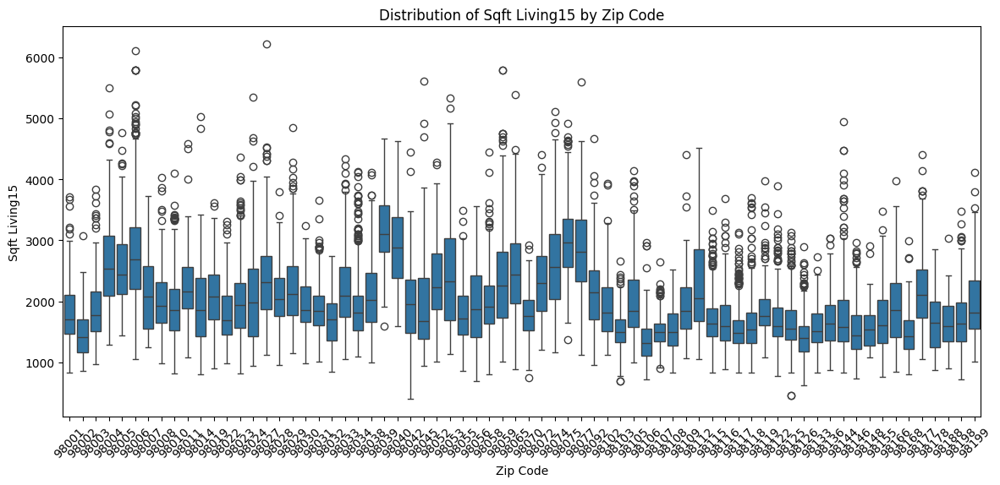

In [203]:
#compare distributions across zip codes
plt.figure(figsize=(14, 6))
sns.boxplot(x='zipcode', y='sqft_living15', data=df)
plt.title('Distribution of Sqft Living15 by Zip Code')
plt.xticks(rotation=45)
plt.xlabel('Zip Code')
plt.ylabel('Sqft Living15')
plt.show()

- Which zip codes have the largest average living space (sqft_living15), and how do house sizes vary across different neighborhoods?

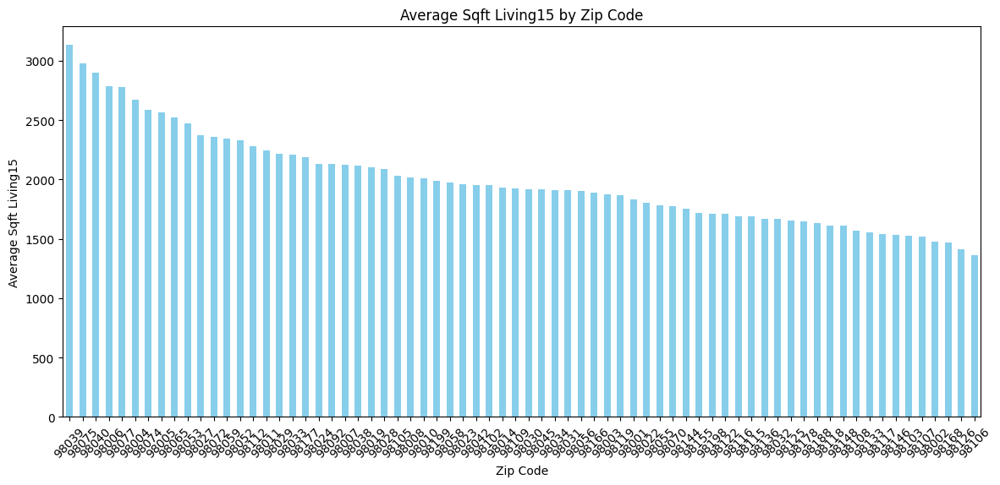

In [204]:
#average Sqft Living15 per Zip Code
avg_living_by_zip = df.groupby('zipcode')['sqft_living15'].mean().sort_values(ascending=False)

plt.figure(figsize=(14, 6))
avg_living_by_zip.plot(kind='bar', color='skyblue')
plt.title('Average Sqft Living15 by Zip Code')
plt.xlabel('Zip Code')
plt.ylabel('Average Sqft Living15')
plt.xticks(rotation=45)
plt.show()

- How does neighborhood lot size relate to location and zip code?

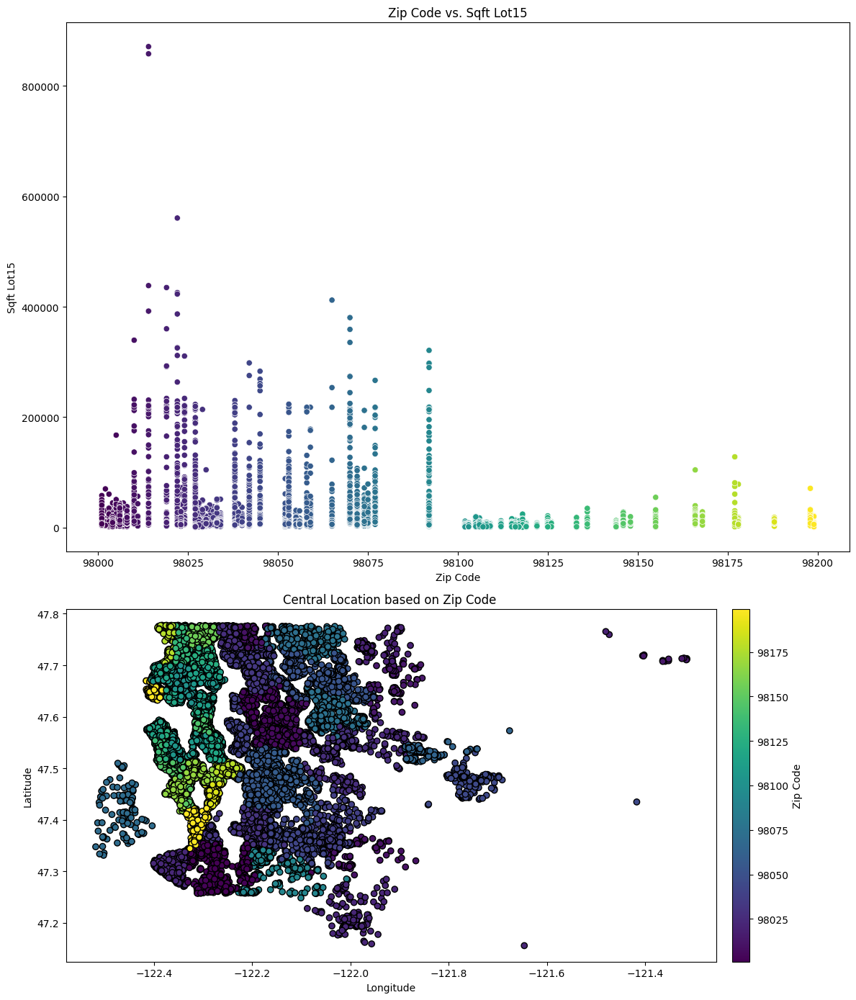

In [205]:
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 14), gridspec_kw={'height_ratios': [3, 2]})

# Plot 1: Zip Code vs. Sqft_Living15
sns.scatterplot(x='zipcode', y='sqft_lot15', data=df, ax=ax1, hue='zipcode', palette='viridis', legend=False)
ax1.set_title('Zip Code vs. Sqft Lot15')
ax1.set_xlabel('Zip Code')
ax1.set_ylabel('Sqft Lot15')

# Plot 2: Zip Code Locations
scatter = ax2.scatter(df['long'], df['lat'], c=df['zipcode'], cmap='viridis', edgecolors='black')
ax2.set_title('Central Location based on Zip Code ')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

#add colorbar for the second plot
cbar = plt.colorbar(scatter, ax=ax2, orientation='vertical', pad=0.02)
cbar.set_label('Zip Code')

plt.tight_layout()
plt.show()

<h3 style="color:hotpink;">Advice:</h3>

<ol style="color:hotpink;">
  <li>Waterfront and views increase house prices</li>
  <li>Lot sizes vary by zip code - bigger lots add value</li>
  <li>Living space size differs across neighborhoods</li>
  <li>Location affects home size and price clusters</li>
</ol>

<h3 style="color:hotpink;">Tips:</h3>

<ol style="color:hotpink;">
  <li>Buyers: Choose areas with good lot size and views within your budget</li>
  <li>Sellers: Highlight waterfront, views, and large lots to boost price</li>
  <li>Investors: Focus on zip codes with bigger lots and growing homes</li>
</ol>


<h2 style="color:teal;">DEEP ANALYSIS FOR ME!</h2>     <!-- Teal -->

- Where are different zip codes located geographically across the region?

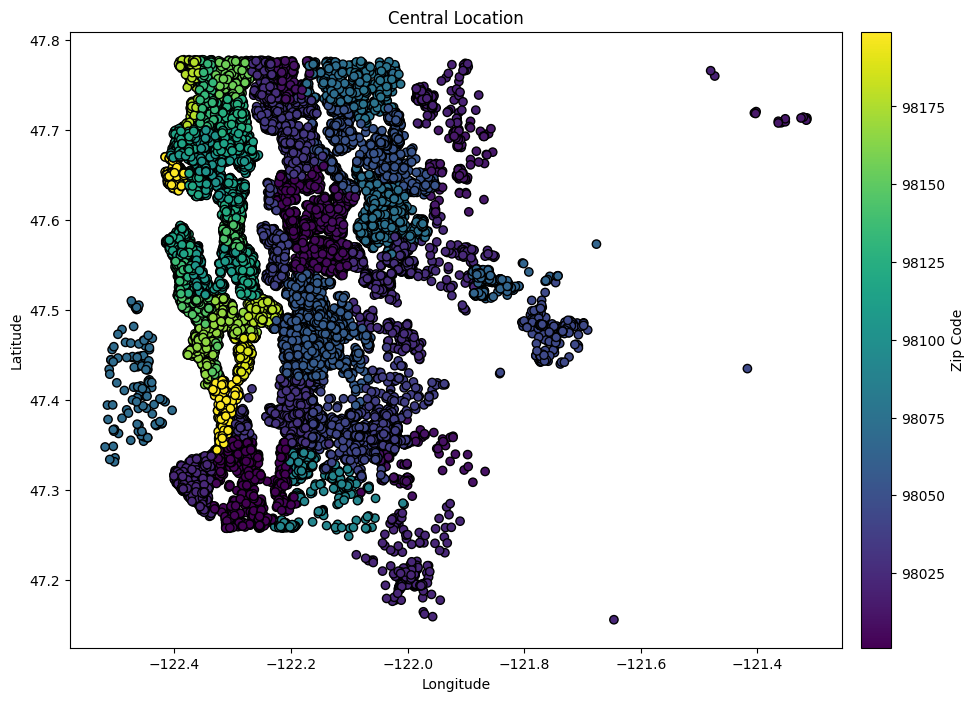

In [206]:
fig, ax = plt.subplots(figsize=(12, 8))

#zip code locations
scatter = ax.scatter(df['long'], df['lat'], c=df['zipcode'], cmap='viridis', edgecolors='black')

#add colorbar
cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Zip Code')

#setting labels and title
ax.set_title('Central Location')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

- How do house prices vary by geographic location?

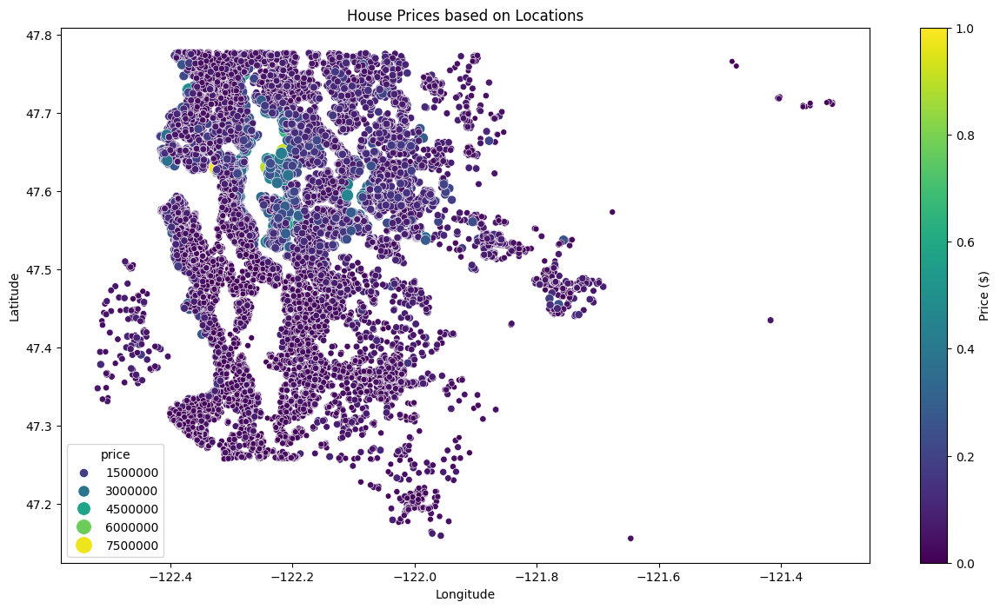

In [207]:
plt.figure(figsize=(15, 8))

#house prices based on zip code locations
scatter_plot = sns.scatterplot(x='long', y='lat', hue='price', data=df, palette='viridis', size='price', sizes=(20, 200))
plt.title('House Prices based on Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

#add colorbar
plt.colorbar(scatter_plot.collections[0], label='Price ($)')
plt.show()

- How do neighborhood lot sizes and geographic locations vary by zip code, especially in the city center?

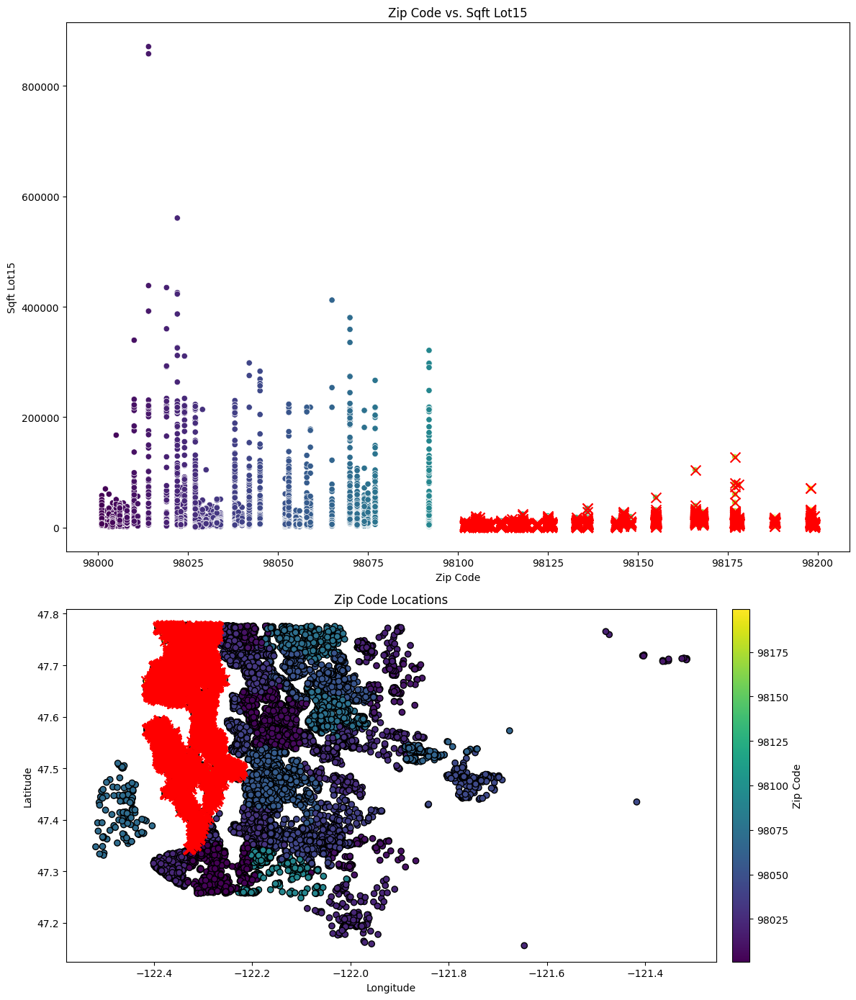

In [208]:
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12, 14), gridspec_kw={'height_ratios': [3, 2]})

#zip code vs. sqft_lot15
sns.scatterplot(x='zipcode', y='sqft_lot15', data=df, ax=ax1, hue='zipcode', palette='viridis', legend=False)
ax1.set_title('Zip Code vs. Sqft Lot15')
ax1.set_xlabel('Zip Code')
ax1.set_ylabel('Sqft Lot15')

#city center zip code range
city_center_zipcodes = range(98100, 98201)  # Range of zip codes from 98100 to 98200
subset_city_center = df[df['zipcode'].isin(city_center_zipcodes)]
ax1.scatter(subset_city_center['zipcode'], subset_city_center['sqft_lot15'], marker='x', color='red', s=100, label='City Center')

#zip code locations
scatter = ax2.scatter(df['long'], df['lat'], c=df['zipcode'], cmap='viridis', edgecolors='black')
ax2.set_title('Zip Code Locations')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

#city center zip code range
ax2.scatter(subset_city_center['long'], subset_city_center['lat'], marker='x', color='red', s=100, label='City Center')

#add colorbar
cbar = plt.colorbar(scatter, ax=ax2, orientation='vertical', pad=0.02)
cbar.set_label('Zip Code')

plt.tight_layout()
plt.show()

- Where is the city center located geographically, and how does it compare to other zip codes?

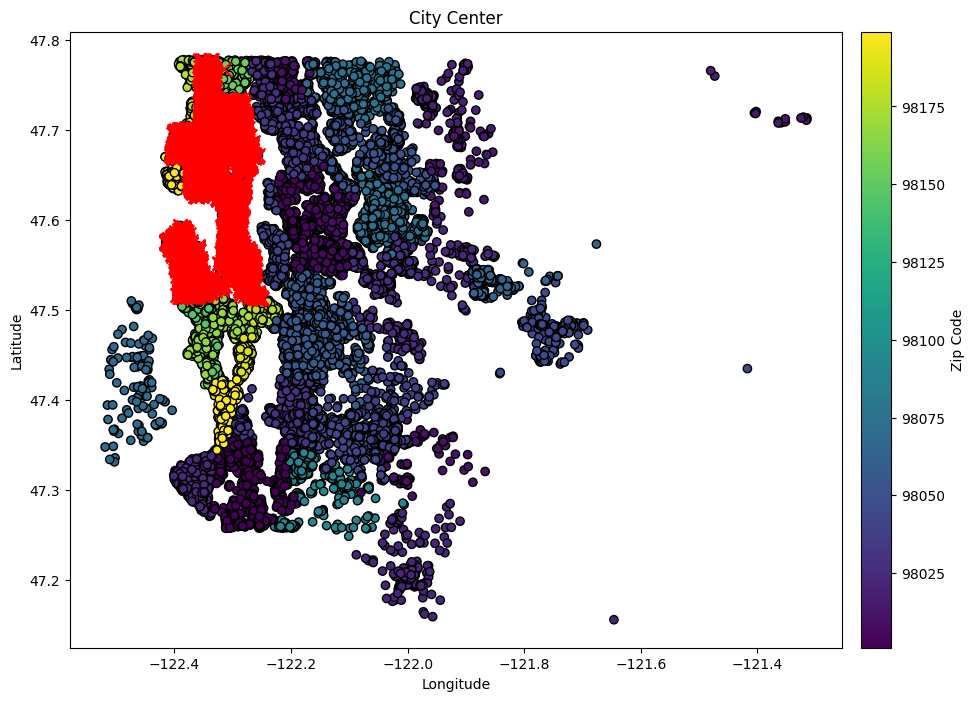

In [209]:
#city center visualization by zip code
fig, ax = plt.subplots(figsize=(12, 8))

#zip code locations
scatter = ax.scatter(df['long'], df['lat'], c=df['zipcode'], cmap='viridis', edgecolors='black')

#city center zip code range
city_center_zipcodes = range(98100, 98145)  # Range of zip codes from 98100 to 98200
subset_city_center = df[df['zipcode'].isin(city_center_zipcodes)]
ax.scatter(subset_city_center['long'], subset_city_center['lat'], marker='x', color='red', s=100, label='City Center')

#add colorbar
cbar = plt.colorbar(scatter, ax=ax, orientation='vertical', pad=0.02)
cbar.set_label('Zip Code')

#setting labels and title
ax.set_title('City Center')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

- How do average house prices vary across different zip codes?

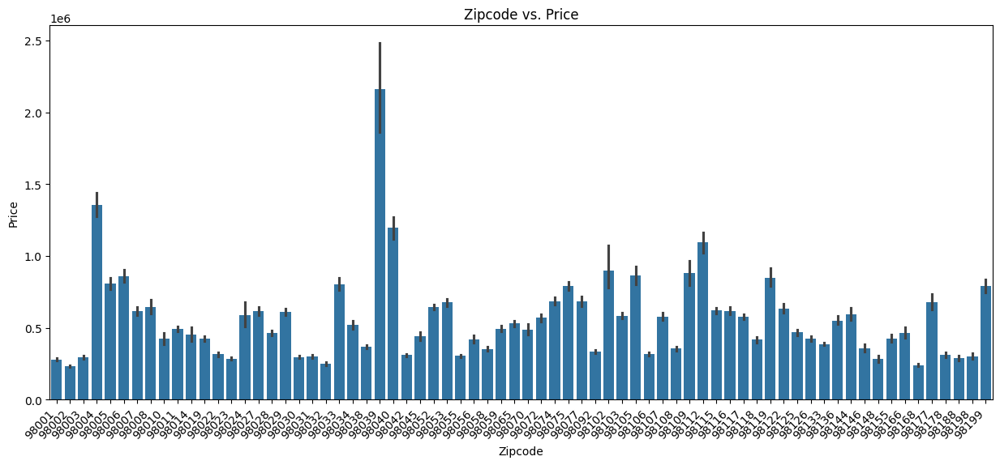

In [210]:
#zipcode vs. price
plt.figure(figsize=(15, 6))
sns.barplot(x='zipcode', y='price', data=df)
plt.title('Zipcode vs. Price')
plt.xlabel('Zipcode')
plt.ylabel('Price')
plt.xticks(rotation=45, ha='right')  
plt.show()

- How are house prices distributed geographically by location?

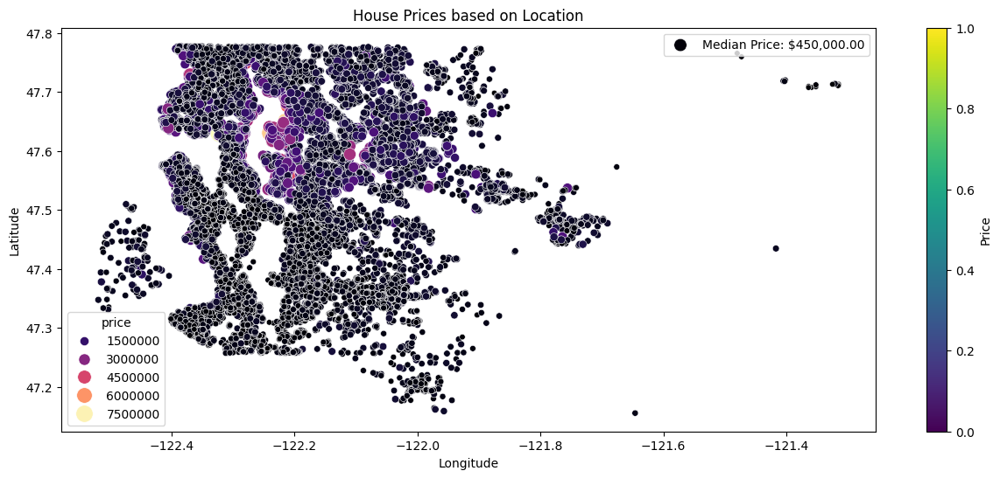

In [211]:
#house prices based on location
plt.figure(figsize=(15, 6))
scatter_plot = sns.scatterplot(x='long', y='lat', hue='price', data=df, palette='magma', size='price', sizes=(20, 200))
plt.title('House Prices based on Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(scatter_plot.collections[0], label='Price')

#add median price to legend 
median_price = df['price'].median()
plt.scatter([], [], marker='s', label=f'Median Price: ${median_price:,.2f}')

#legend
scatter_legend = scatter_plot.get_legend()

#new legend 
plt.legend([f'Median Price: ${median_price:,.2f}'], loc='upper right')

plt.gca().add_artist(scatter_legend)
plt.show()

- What are the highest house prices in the top 9 zip codes with the most expensive homes?

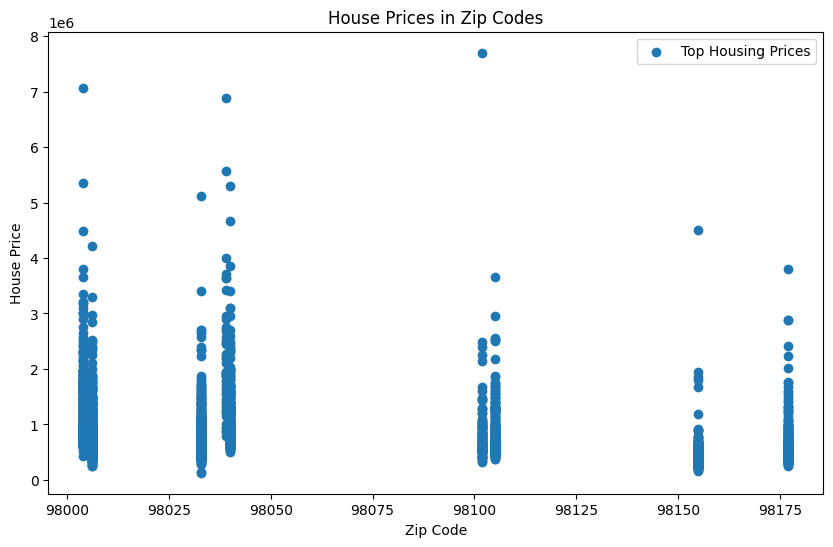

In [212]:
#house prices in zip codes
top_zipcodes = df.groupby('zipcode')['price'].max().nlargest(9)

top_df = df[df['zipcode'].isin(top_zipcodes.index)]

#dsiplay
plt.figure(figsize=(10, 6))
plt.scatter(top_df['zipcode'], top_df['price'], label='Top Housing Prices')
plt.xlabel('Zip Code')
plt.ylabel('House Price')
plt.title('House Prices in Zip Codes')
plt.legend()
plt.show()

- How are house prices distributed within the middle 25th to 75th percentile range across different zip codes?

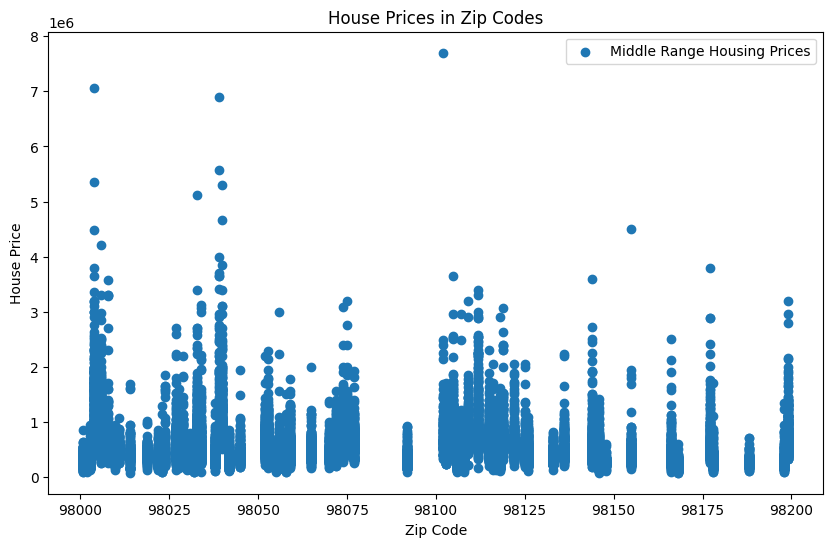

In [213]:
#house prices in middle range zip codes
lower_percentile = 25
upper_percentile = 75

middle_zipcodes = df.groupby('zipcode')['price'].agg(lambda x: x.quantile((lower_percentile/100, upper_percentile/100)).mean())

#filter 
middle_df = df[df['zipcode'].isin(middle_zipcodes.index)]

#display
plt.figure(figsize=(10, 6))
plt.scatter(middle_df['zipcode'], middle_df['price'], label='Middle Range Housing Prices')
plt.xlabel('Zip Code')
plt.ylabel('House Price')
plt.title('House Prices in Zip Codes')
plt.legend()
plt.show()

- How many houses with and without waterfront views are there in each zip code?

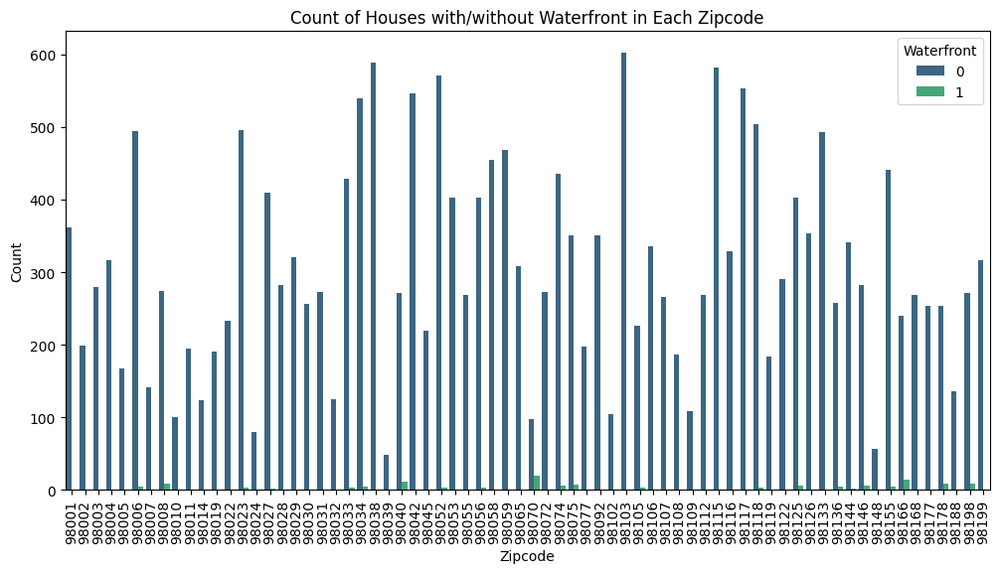

In [214]:
#zipcode vs. waterfront
plt.figure(figsize=(12, 6))
sns.countplot(x='zipcode', hue='waterfront', data=df, palette='viridis')
plt.title('Count of Houses with/without Waterfront in Each Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='Waterfront', loc='upper right')
plt.show()

- How many houses have different levels of view quality across zip codes?

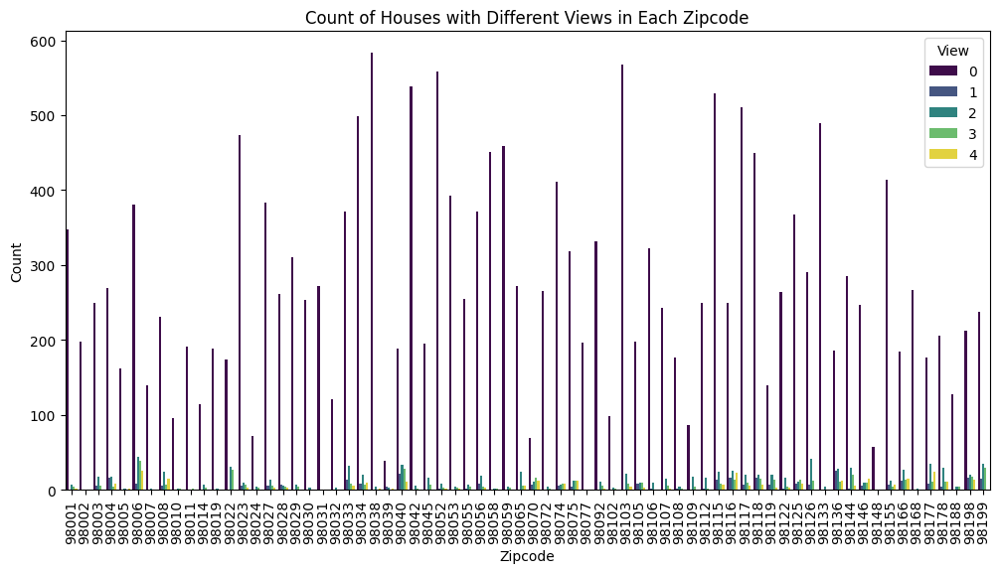

In [215]:
#zipcode vs. view
plt.figure(figsize=(12, 6))
sns.countplot(x='zipcode', hue='view', data=df, palette='viridis')
plt.title('Count of Houses with Different Views in Each Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='View', loc='upper right')
plt.show()

- Which features have the strongest correlation with house prices?

/var/folders/lt/2dp2k6b12vj25g_wlskpks300000gn/T/ipykernel_10910/3747559979.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlation_matrix['price'].sort_values(ascending=False).index,


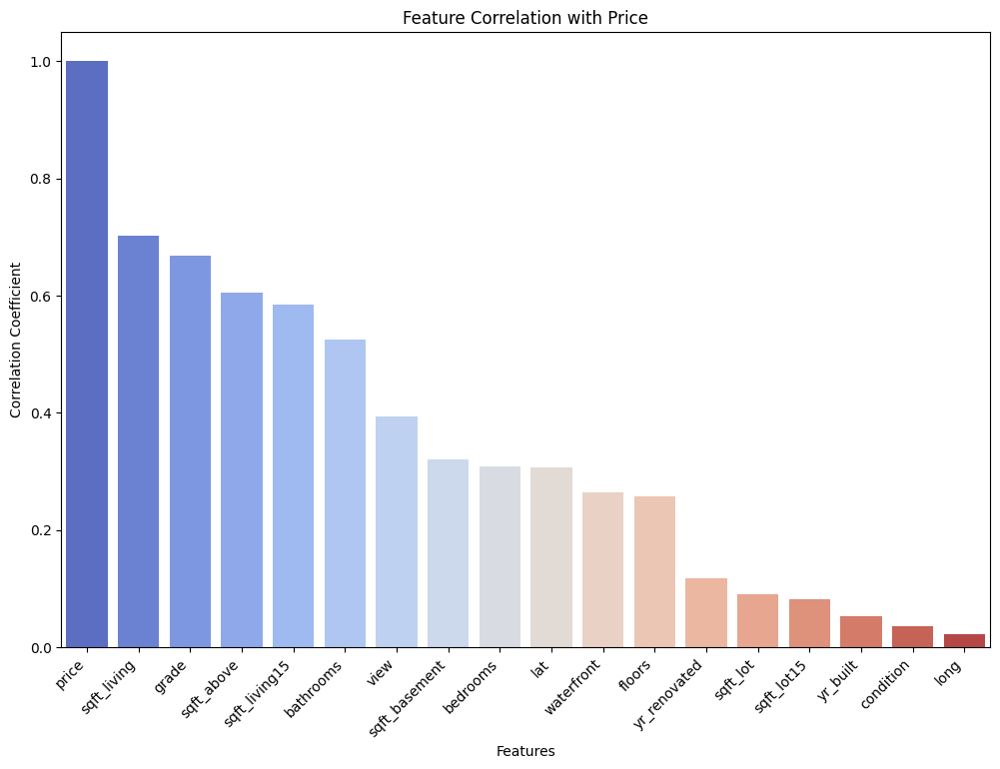

In [216]:
#feature correlation vs. price
selected_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront',
                      'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built',
                      'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'price']

df_selected = df[selected_features]

correlation_matrix = df_selected.corr()

#display
plt.figure(figsize=(12, 8))
sns.barplot(x=correlation_matrix['price'].sort_values(ascending=False).index,
            y=correlation_matrix['price'].sort_values(ascending=False),
            palette="coolwarm")
plt.title('Feature Correlation with Price')
plt.xlabel('Features')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45, ha="right")
plt.show()

- How are various house features correlated with each other and with the price?

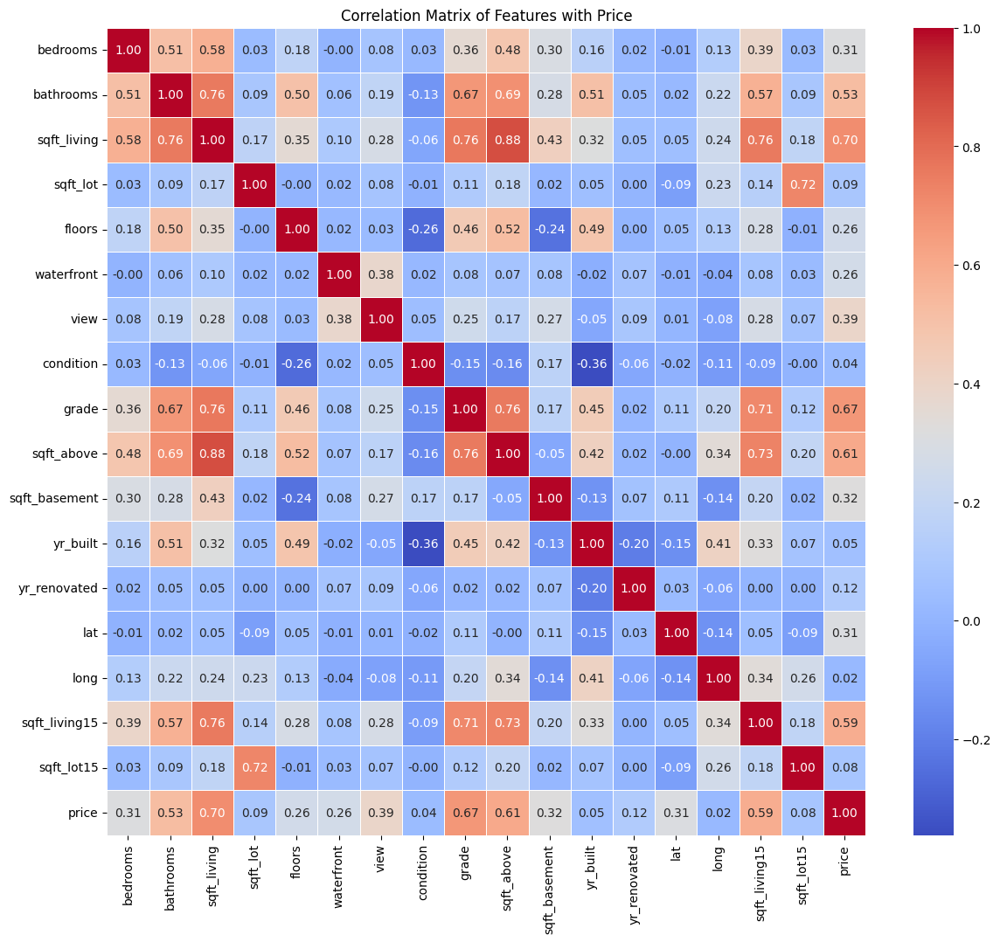

In [217]:
#correlation matrix of features vs. price
selected_features = ['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront',
                      'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built',
                      'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15']

selected_features.append('price')

subset_df = df[selected_features]
correlation_matrix = subset_df.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Features with Price')
plt.show()

- How does home size (square footage of living area) relate to house price?

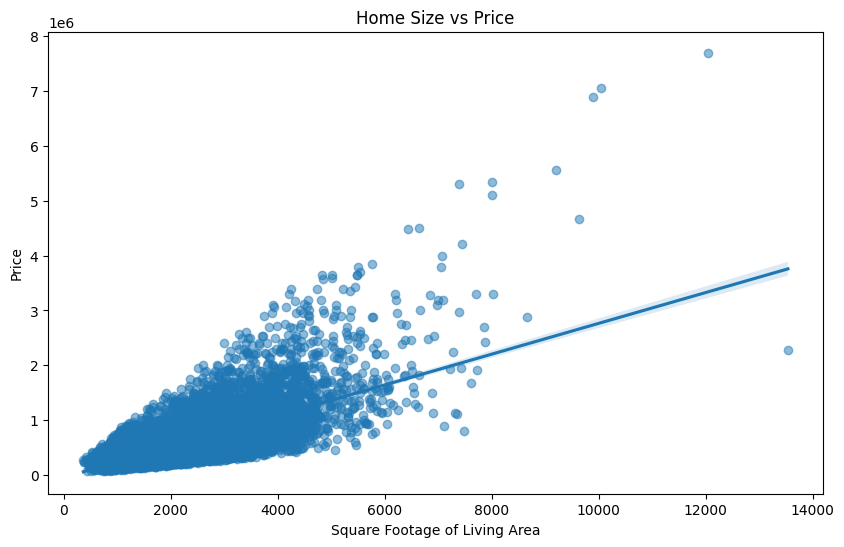

In [218]:
#home size vs. price
plt.figure(figsize=(10, 6))
sns.regplot(x='sqft_living', y='price', data=df, scatter_kws={'alpha':0.5})
plt.title('Home Size vs Price')
plt.xlabel('Square Footage of Living Area')
plt.ylabel('Price')
plt.show()

- How does the median house price change with increasing square footage of the living area?

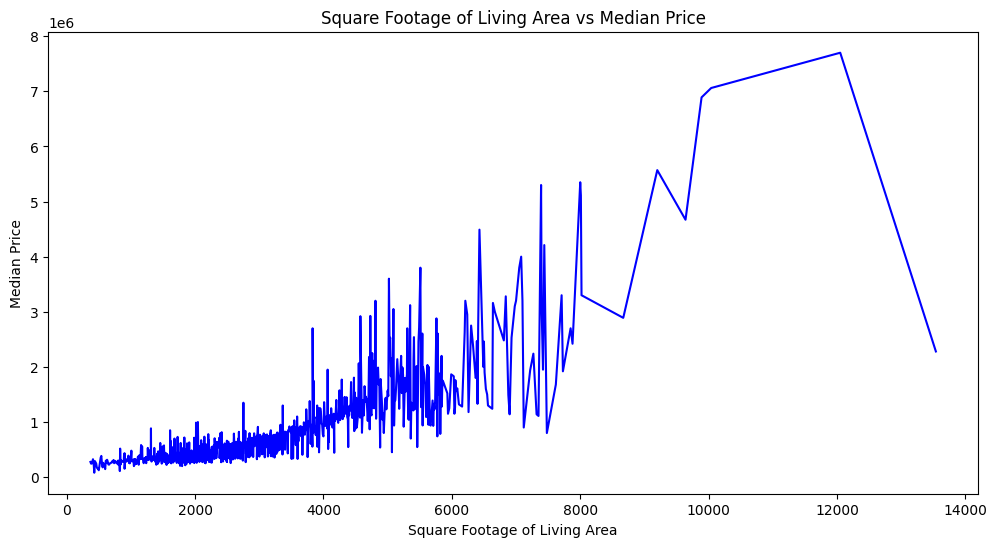

In [219]:
#sqft living area vs. median price
plt.figure(figsize=(12, 6))
sns.lineplot(x='sqft_living', y='price', data=df.groupby('sqft_living')['price'].median().reset_index(), color='b')
plt.title('Square Footage of Living Area vs Median Price')
plt.xlabel('Square Footage of Living Area')
plt.ylabel('Median Price')
plt.show()

In [220]:
df['sqft_living'].unique()

array([1180, 2570,  770, ..., 3087, 3118, 1425])

- How does the median house price vary with the number of bedroom?

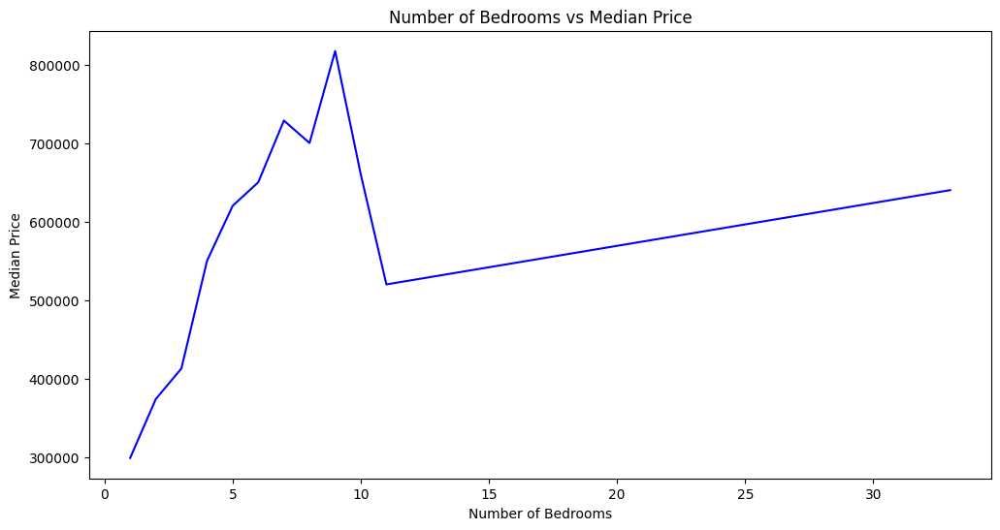

In [221]:
#number of bedrooms vs. median price 
plt.figure(figsize=(12, 6))
sns.lineplot(x='bedrooms', y='price', data=df.groupby('bedrooms')['price'].median().reset_index(), color='b')
plt.title('Number of Bedrooms vs Median Price')
plt.xlabel('Number of Bedrooms')
plt.ylabel('Median Price')
plt.show()

In [222]:
df['bedrooms'].unique()

array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10, 33])

- What is the distribution of home prices in King County?

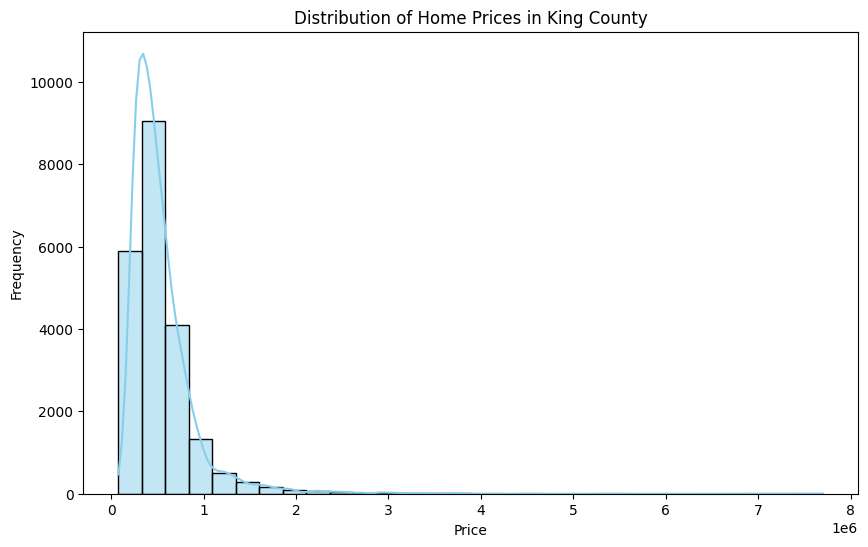

In [223]:
#distribution of home prices
plt.figure(figsize=(10, 6))
sns.histplot(df['price'], bins=30, kde=True, color='skyblue')
plt.title('Distribution of Home Prices in King County')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

- Which features are most strongly correlated with house price?

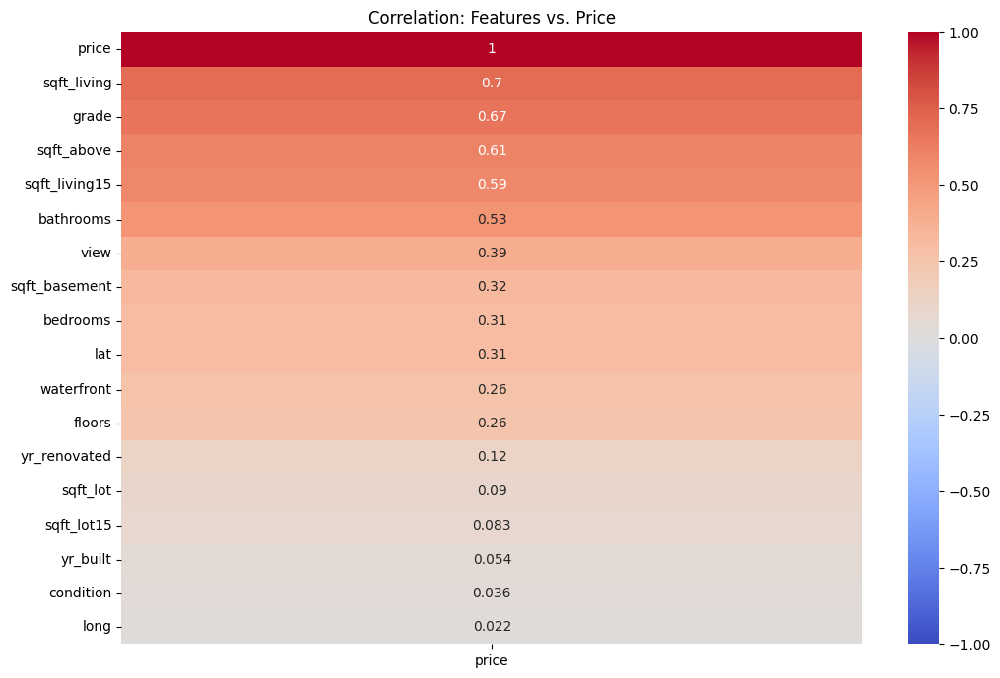

In [224]:
#corelation between features vs. price
correlation_matrix = subset_df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix[['price']].sort_values(by='price', ascending=False),
            annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation: Features vs. Price')
plt.show()

In [225]:
#import libraries for real-world map for visualization 
!pip install contextily



[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


In [226]:
# #geographic distribution of house sales across different zip codes

# import contextily as ctx

# #Map Using Contextly #Define the new colors you want to use
# #new_colors = ['navy', 'red', 'royalblue', 'darkorange', 'purple', 'hotpink']

# unique_zipcodes = df['zipcode'].nunique()
# palette = sns.color_palette('tab20', n_colors=unique_zipcodes)  # or 'hsv', 'Paired', etc.

# # Map zipcodes to palette colors
# zipcodes_sorted = sorted(df['zipcode'].unique())
# zip_palette = dict(zip(zipcodes_sorted, palette))

# # Plot
# fig, ax = plt.subplots(figsize=(16, 25))
# scatter = sns.scatterplot(
#     data=df, x='long', y='lat', hue='zipcode',
#     palette=zip_palette,
#     legend='full',
#     ax=ax,
#     edgecolors='black',
#     alpha=0.7
# )
# # Dictionary mapping zip codes to names for the legend /Didn't work
# zipcode_names = {98004: 'Bellevue', 98006: 'Bellevue', 98039: 'Medina', 98040: 'Mercer Island',
#                  98102: 'Eastlake|Cascade(Seattle)', 98112:'Capitol Hill/Montlake'}

# # Create legend labels for all unique zipcodes in df
# legend_labels = [zipcode_names.get(code, str(code)) for code in df['zipcode'].unique()]

# # Assuming you have already defined filtered_df
# fig, ax = plt.subplots(figsize=(16, 25))
# # Create a scatterplot with the specified color palette
# maps_fig = sns.scatterplot(data=df, x='long', y='lat', hue='zipcode', palette=new_colors, legend=True, ax=ax)
# maps_fig.legend(labels=legend_labels, bbox_to_anchor=(1.05, 1), loc='upper right')
# # Set the title and labels
# maps_fig.set_title('Zipcodes with Top 20 Average Monthly Sales 2014 to 2015')
# maps_fig.set_xlabel('Longitude')
# maps_fig.set_ylabel('Latitude')
# # Rename legend labels using the zipcode_names dictionary
# legend_labels = [zipcode_names[code] if code in zipcode_names else code for code in df['zipcode'].unique()]
# # Add map background from OpenStreetMap using contextily
# ctx.add_basemap(ax, crs='EPSG:4326')  # Add OpenStreetMap tiles in Web Mercator projection
# # Show the plot
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')  # Adjust the legend position
# plt.tight_layout()
# plt.show()

- How are house sales geographically distributed across different zip codes, and which neighborhoods show higher concentrations of sales activity from 2014 to 2015?

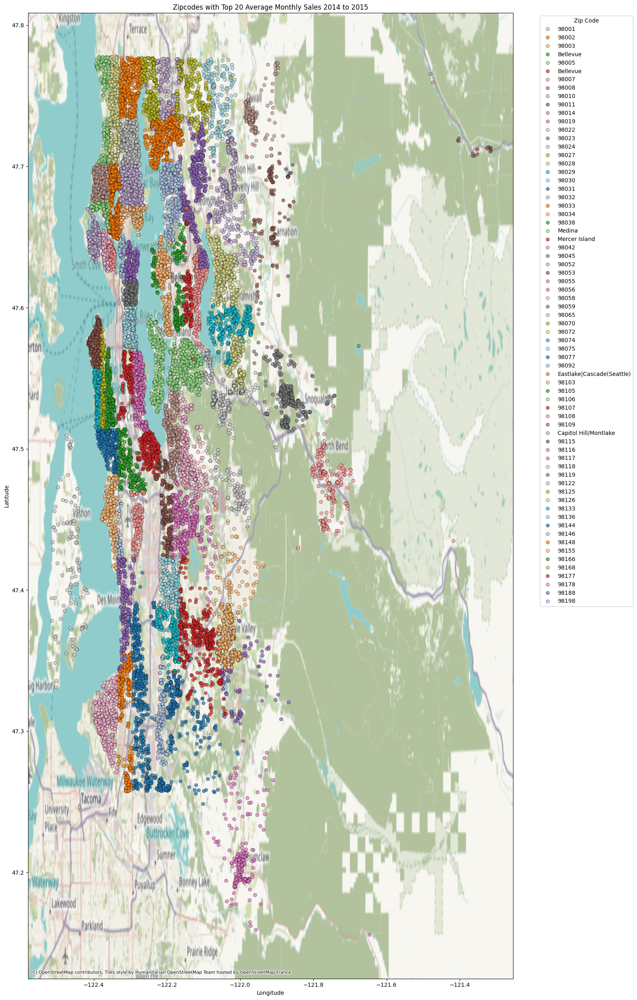

In [227]:
#geographic distribution of house sales across different zip codes
unique_zipcodes = df['zipcode'].nunique()
palette = sns.color_palette('tab20', n_colors=unique_zipcodes)  # or 'hsv', 'Paired', etc.

#map zipcodes to palette colors
zipcodes_sorted = sorted(df['zipcode'].unique())
zip_palette = dict(zip(zipcodes_sorted, palette))

#display
fig, ax = plt.subplots(figsize=(16, 25))
scatter = sns.scatterplot(
    data=df, x='long', y='lat', hue='zipcode',
    palette=zip_palette,
    legend='full',
    ax=ax,
    edgecolors='black',
    alpha=0.7
)

#settting legend labels for zipcodes with custom names when available
zipcode_names = {98004: 'Bellevue', 98006: 'Bellevue', 98039: 'Medina', 98040: 'Mercer Island',
                 98102: 'Eastlake|Cascade(Seattle)', 98112: 'Capitol Hill/Montlake'}

legend_labels = [zipcode_names.get(code, str(code)) for code in zipcodes_sorted]
handles, _ = scatter.get_legend_handles_labels()
ax.legend(handles=handles[1:], labels=legend_labels, bbox_to_anchor=(1.05, 1), loc='upper left', title='Zip Code')

#add map background
ctx.add_basemap(ax, crs='EPSG:4326')

ax.set_title('Zipcodes with Top 20 Average Monthly Sales 2014 to 2015')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.tight_layout()
plt.show()